FOR MU  DATASET

In [122]:
import os
import zipfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, resample
from sklearn.preprocessing import StandardScaler
from google.colab import files
from scipy.interpolate import interp1d

In [123]:
mu_data = pd.read_csv('MU.txt', delim_whitespace=True)
mu_data.to_csv('MU.csv')
mu_data.head()

<ipython-input-123-432a33018ef8>:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  mu_data = pd.read_csv('MU.txt', delim_whitespace=True)


,978111,132669,MU,TP9,6,459,"475,474,477,486,486,476,479,483,489,483,482,485,486,483,474,475,484,481,482,478,476,479,487,481,480,479,487,486,471,487,491,488,491,470,460,485,484,482,485,480,487,488,479,471,479,485,484,484,478,478,479,511,524,529,530,529,525,524,533,520,516,520,525,526,521,519,526,527,529,520,520,514,522,523,514,515,517,523,517,515,528,522,530,520,519,504,532,529,528,532,523,531,524,514,522,524,524,519,516,512,519,519,526,517,519,512,523,527,518,530,529,527,524,519,522,520,516,527,525,522,528,524,518,524,530,522,518,514,518,533,521,526,527,524,524,527,512,519,520,519,515,522,535,528,528,526,526,539,528,519,528,527,523,529,519,511,524,522,525,520,515,519,522,519,517,521,528,523,527,530,515,532,526,528,518,523,535,528,524,532,529,522,519,524,532,529,523,503,513,519,516,499,513,516,505,510,508,511,513,511,500,509,515,505,509,504,504,513,509,512,506,504,513,507,504,511,511,504,515,505,516,510,517,511,514,513,520,506,504,510,509,519,516,506,502,508,510,507,500,506,508,510,513,513,517,516,511,510,499,509,514,507,503,504,505,514,498,501,507,507,506,499,514,513,518,508,502,512,514,507,506,510,499,513,513,507,507,507,507,500,503,501,508,512,507,507,521,517,525,520,516,513,512,512,511,507,508,506,505,508,515,518,513,511,508,513,511,513,500,504,516,518,513,506,510,516,511,509,505,510,515,501,501,506,517,523,516,517,533,520,521,515,511,523,517,513,514,527,523,517,514,514,512,519,514,515,514,515,517,521,520,530,522,522,516,517,523,524,509,517,524,525,515,523,516,523,525,519,516,516,530,519,517,522,512,521,522,523,518,516,522,518,515,514,531,525,519,519,522,527,525,521,516,507,511,523,515,514,523,516,515,511,515,517,521,513,509,527,519,523,521,513,519,530,528,520,518,515,514,506,516,521,522,517,514,506,517,521,524,509,513,521,520,521,514,516,520,519,519,514,515,517,522,511,512,517,517,511,512,513,519,523,515,513,517,519,516,514,517"
0,978112,132669,MU,FP1,6,459,"468,487,493,493,498,493,491,490,492,487,483,48..."
1,978113,132669,MU,FP2,6,459,"482,475,490,500,485,470,470,482,490,484,478,48..."
2,978114,132669,MU,TP10,6,459,"470,470,478,489,487,475,469,478,488,483,474,48..."
3,978115,132670,MU,TP9,7,493,"506,499,495,491,492,507,496,500,498,496,499,50..."
4,978116,132670,MU,FP1,7,493,"505,515,513,506,512,520,512,521,517,512,517,52..."


Structure of the txt file is     
  Id  ,  event  ,    device    , channel     ,  code  ,     size  ,     signal values

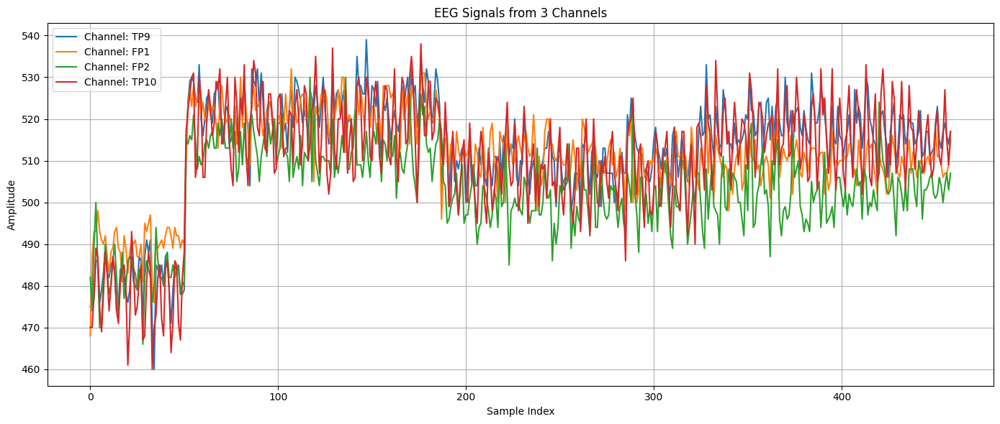

In [124]:
import matplotlib.pyplot as plt

# Path to your file
mu_txt_path = '/content/MU.txt'  # Change this to your actual file path

# Function to parse a line into signal data
def parse_line(line):
    parts = line.strip().split('\t')
    channel = parts[3]
    signal = list(map(int, parts[6].split(',')))
    return channel, signal

# Read and parse the first 4 lines (4 channels from a trial)
channels = []
signals = []

with open(mu_txt_path, 'r') as file:
    for _ in range(4):  # Adjust if you want more/less channels
        line = file.readline()
        channel, signal = parse_line(line)
        channels.append(channel)
        signals.append(signal)

# Plotting
plt.figure(figsize=(14, 6))
for ch, sig in zip(channels, signals):
    plt.plot(sig, label=f'Channel: {ch}')

plt.title("EEG Signals from 3 Channels")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Applying filter

In [125]:
from scipy import signal
from collections import defaultdict

def bandpass_filter(signal_data, fs, lowcut, highcut, order=4):
    signal_data = np.atleast_1d(signal_data)  # Ensures it's at least 1D

    if signal_data.ndim != 1:
        raise ValueError(f"Expected 1D input signal, got shape {signal_data.shape}")

    nyquist = fs / 2
    low = lowcut / nyquist
    high = highcut / nyquist

    if not (0 < low < 1 and 0 < high < 1):
        raise ValueError(f"Invalid bandpass range: low={low}, high={high}")

    b, a = butter(order, [low, high], btype='band')

    padlen = 3 * max(len(a), len(b))
    if len(signal_data) <= padlen:
        raise ValueError(
            f"Signal too short for filtering. Length: {len(signal_data)}, Required: > {padlen}"
        )

    return filtfilt(b, a, signal_data)

trial_to_plot= 6
lowcut=1
highcut=40
fs=256
order=4

trial_data = defaultdict(list)


with open(mu_txt_path, 'r') as file:
    for line in file:
        parts = line.strip().split('\t')
        code = parts[4]
        channel = parts[3]
        size= parts[5]
        signal_parts=[part for part in parts[6].split(',')if part]
        try:
            signal = np.array(list(map(int, signal_parts)))
            trial_data[code].append((channel, signal))
        except ValueError:
            print(f"Error processing line: {line}")




In [126]:
def preprocessing(signal):
  try:
        signal = np.array([float(x) for x in signal_str.split(',')], dtype=np.float32)
  except Exception as e:
        print(f"Error converting signal: {e}")
        return np.array([])  # Or handle as needed
  signal=np.array(signal,dtype=np.float32)
  if np.any(np.isnan(signal)):
        n = len(signal)
        not_nan = ~np.isnan(signal)
        signal = np.interp(np.arange(n), np.where(not_nan)[0], signal[not_nan])
        signal = bandpass_filter(signal, lowcut, highcut, fs, order)

        signal = np.asarray(signal).reshape(-1, 1)  # Reshape to 2D for StandardScaler
        scaler = StandardScaler()
        normalized = scaler.fit_transform(signal)
        return normalized.flatten()

In [127]:

def interpolate(signal, median_size):
 interpolated_signals = []
 if len(signal) ==median_size:
  return signal

 original_indices = np.linspace(0, 1, len(signal))
 target_indices = np.linspace(0, 1, median_size)
 interpolator = interp1d(original_indices, signal, kind='linear')
 interpolated = interpolator(target_indices)


 return interpolated


In [128]:
mu_data.columns =['id','event','device','channel','code','size','data']
mu_data

,id,event,device,channel,code,size,data
0,978112,132669,MU,FP1,6,459,"468,487,493,493,498,493,491,490,492,487,483,48..."
1,978113,132669,MU,FP2,6,459,"482,475,490,500,485,470,470,482,490,484,478,48..."
2,978114,132669,MU,TP10,6,459,"470,470,478,489,487,475,469,478,488,483,474,48..."
3,978115,132670,MU,TP9,7,493,"506,499,495,491,492,507,496,500,498,496,499,50..."
4,978116,132670,MU,FP1,7,493,"505,515,513,506,512,520,512,521,517,512,517,52..."
...,...,...,...,...,...,...,...
163926,1142038,173650,MU,TP10,-1,460,"537,531,530,531,533,537,537,555,534,522,531,54..."
163927,1142039,173651,MU,TP9,-1,460,"521,517,526,524,514,519,520,526,526,514,519,52..."
163928,1142040,173651,MU,FP1,-1,460,"525,518,522,525,523,523,512,523,519,522,523,52..."
163929,1142041,173651,MU,FP2,-1,460,"502,493,500,511,510,512,523,507,497,503,502,50..."


In [129]:
fp1= mu_data[mu_data['channel']=='FP1']
fp2= mu_data[mu_data['channel']=='FP2']
tp9= mu_data[mu_data['channel']=='T9']
tp10= mu_data[mu_data['channel']=='T10']

In [130]:
median_size= int(fp1['size'].median())
median_size
fp1['data'] = fp1['data'].apply(lambda x: np.array(list(map(float, x.split(',')))) if isinstance(x, str) else x)
fp1

<ipython-input-130-46927fa5fe7d>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fp1['data'] = fp1['data'].apply(lambda x: np.array(list(map(float, x.split(',')))) if isinstance(x, str) else x)


,id,event,device,channel,code,size,data
0,978112,132669,MU,FP1,6,459,"[468.0, 487.0, 493.0, 493.0, 498.0, 493.0, 491..."
4,978116,132670,MU,FP1,7,493,"[505.0, 515.0, 513.0, 506.0, 512.0, 520.0, 512..."
8,978120,132671,MU,FP1,6,459,"[502.0, 516.0, 514.0, 508.0, 514.0, 520.0, 520..."
12,978124,132672,MU,FP1,6,459,"[512.0, 529.0, 527.0, 526.0, 522.0, 522.0, 525..."
16,978128,132673,MU,FP1,1,493,"[506.0, 511.0, 513.0, 518.0, 505.0, 522.0, 526..."
...,...,...,...,...,...,...,...
163912,1142024,173647,MU,FP1,-1,460,"[510.0, 521.0, 506.0, 509.0, 514.0, 514.0, 519..."
163916,1142028,173648,MU,FP1,-1,460,"[535.0, 536.0, 532.0, 529.0, 531.0, 531.0, 527..."
163920,1142032,173649,MU,FP1,-1,460,"[514.0, 511.0, 515.0, 522.0, 521.0, 522.0, 517..."
163924,1142036,173650,MU,FP1,-1,460,"[522.0, 529.0, 522.0, 529.0, 529.0, 522.0, 523..."


In [131]:
fp1_signal_list = fp1['data'].apply(lambda x: np.array(x)).tolist()
fp1_interpolated=[interpolate(sig,median_size) for sig in fp1_signal_list]
fp1_interpolated

Output hidden; open in https://colab.research.google.com to view.

In [132]:
median_size= int(fp2['size'].median())
median_size
fp2['data'] = fp2['data'].apply(lambda x: np.array(list(map(float, x.split(',')))) if isinstance(x, str) else x)
fp2_signal_list = fp2['data'].apply(lambda x: np.array(x)).tolist()
fp2_interpolated=[interpolate(sig,median_size) for sig in fp2_signal_list]
fp2_interpolated

Output hidden; open in https://colab.research.google.com to view.

FOR MW DATASET


In [141]:
mw_data = pd.read_csv('MW.txt', delim_whitespace=True)
mw_data.to_csv('MW.csv')
mw_data.head()

<ipython-input-141-8dffa59ce88a>:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  mw_data = pd.read_csv('MW.txt', delim_whitespace=True)


,0,0.1,MW,FP1,0.2,1017,"38,48,51,44,48,56,56,41,20,-3,-9,-1,6,5,6,17,24,38,56,57,52,52,48,37,39,51,51,40,37,34,27,25,23,21,25,37,43,45,53,57,60,71,73,67,58,51,40,40,53,72,88,89,88,92,88,81,92,117,124,119,123,140,144,140,147,150,154,152,140,131,122,122,133,148,162,169,171,162,146,135,139,154,162,154,145,150,164,166,156,140,134,150,168,156,123,107,112,107,103,103,109,128,136,130,115,96,86,100,124,131,100,64,56,76,105,128,118,93,66,48,44,48,53,53,48,33,33,41,56,70,72,69,69,86,96,80,67,67,69,60,53,52,53,54,54,54,61,70,68,68,71,72,69,70,77,76,66,60,71,68,48,19,19,50,67,58,49,39,34,42,67,80,70,59,55,38,24,37,59,70,54,26,16,11,19,33,41,41,34,27,25,34,32,5,-12,-1,29,41,27,9,4,7,8,-3,-11,-9,-2,-6,-22,-35,-34,-17,-7,-12,-12,2,10,4,5,10,18,16,12,24,26,21,20,20,25,28,25,21,10,-11,-37,-42,-34,-13,5,16,10,-2,-21,-34,-25,-4,4,-9,-29,-40,-35,-22,-14,-8,-2,0,-11,-22,-25,-38,-53,-54,-52,-52,-49,-38,-38,-41,-41,-37,-35,-36,-30,-29,-44,-52,-37,-17,-10,-23,-37,-35,-20,-6,2,4,7,19,22,21,21,9,-3,0,1,-4,-10,-11,-5,-2,2,10,18,18,11,17,21,7,-7,0,16,12,5,3,4,3,1,5,17,19,9,2,2,2,-2,-7,-17,-22,-27,-22,-13,-12,-13,-5,1,10,24,27,27,33,42,40,21,-1,-8,-4,1,-3,-21,-38,-43,-41,-35,-22,-8,-6,-6,4,18,34,56,71,70,67,69,69,60,48,38,39,44,38,18,6,20,42,54,81,98,84,53,37,43,49,22,43,80,97,102,114,120,113,98,85,89,107,114,108,102,86,83,100,117,121,116,102,76,64,67,67,65,68,82,96,100,90,84,96,108,109,99,81,59,45,38,23,6,-5,1,12,12,4,-17,-40,-51,-53,-62,-60,-53,-55,-73,-99,-119,-120,-99,-67,-55,-70,-71,-72,-68,-54,-50,-46,-37,-20,-3,0,-5,4,22,37,49,51,52,52,59,65,58,57,58,52,42,41,33,19,11,17,34,41,22,-1,-18,-36,-43,-35,-36,-61,-78,-76,-70,-66,-60,-62,-67,-60,-52,-52,-50,-33,-5,5,-2,-11,-13,-26,-43,-62,-87,-102,-93,-82,-87,-92,-84,-59,-43,-34,-29,-44,-54,-51,-54,-51,-40,-34,-33,-35,-35,-42,-51,-49,-35,-22,-21,-24,-18,-8,-4,-7,-12,-20,-35,-55,-71,-72,-65,-53,-42,-49,-54,-44,-24,-13,-35,-59,-70,-59,-42,-36,-17,-1,4,6,10,27,41,51,53,38,17,7,4,44,52,35,26,29,36,23,5,4,5,-1,-9,-8,3,13,17,18,25,48,70,69,57,58,59,54,55,57,54,44,42,64,82,91,90,75,53,38,50,59,53,52,59,60,57,61,69,75,88,112,132,144,148,149,151,147,137,131,133,139,139,129,115,105,72,55,57,67,68,57,45,40,40,38,33,37,44,52,68,74,69,54,38,40,52,58,58,45,44,65,86,92,104,116,119,114,103,103,117,137,134,104,72,54,58,73,88,83,57,44,56,85,103,102,90,82,85,91,86,76,60,43,53,70,66,56,65,85,88,86,80,60,49,33,23,37,61,81,80,66,59,64,64,56,52,51,48,33,11,0,-6,-7,-2,4,11,22,37,54,69,80,80,77,82,80,70,52,39,41,48,48,51,58,75,81,76,77,86,84,72,69,72,72,73,73,73,88,103,104,98,85,71,59,52,53,54,48,24,17,20,28,28,27,32,29,24,27,48,66,74,68,53,40,38,42,38,20,4,-1,3,4,1,3,7,13,27,37,35,26,22,23,23,26,35,42,52,57,49,35,36,38,40,48,51,40,36,51,71,86,96,92,86,86,97,90,89,80,72,92,117,124,123,133,144,136,130,119,117,119,112,92,77,68,64,66,66,64,65,68,74,67,60,74,88,83,67,59,68,64,41,19,5,8,13,7,2,1,8,11,12,17,19,21,19,12,9,4,4,8,16,24,35,25,20,38,61,72,75,69,52,38,40,52,65,76,82,66,40,20,16,19,21,16,-2,-17,-7,17,32,40,44,37,27,21,23,27,29,25,20,22,26,22,25,29,17,2,-6,-5,-2,-9,-11,-9,-4,4,17,29,33,28,28,35,40,58,82,96,92,92,103,118,136,146,145,134,117,105,91,72,66,69,76,77,67,50,32,13,10,17,20,32,43,38,32,32,38,41,49,58,64,55,49,52,60,67,60,65,74,75,72,73,88,89,75,65,65,70,70,58,43,41,56,75,87,72,50,42,52,60,69,71,60,51,45,52,64,75,84,83,81"
0,1,1,MW,FP1,1,889,"83,74,65,65,66,55,43,25,18,20,26,33,41,38,28,3..."
1,2,2,MW,FP1,4,1017,"19,10,-2,-9,-5,3,8,7,8,2,-10,-21,-22,-27,-30,-..."
2,3,3,MW,FP1,1,1017,"17,29,36,26,21,17,17,13,17,21,25,26,20,5,-5,-1..."
3,4,4,MW,FP1,8,952,"77,74,69,70,76,75,76,75,67,66,76,93,98,82,55,3..."
4,5,5,MW,FP1,4,1015,"60,59,59,55,36,18,12,20,23,6,-10,-11,-6,-5,-7,..."


In [142]:
mw_data.columns= ['id','event','device','channel','code','size','data']
mw_data

,id,event,device,channel,code,size,data
0,1,1,MW,FP1,1,889,"83,74,65,65,66,55,43,25,18,20,26,33,41,38,28,3..."
1,2,2,MW,FP1,4,1017,"19,10,-2,-9,-5,3,8,7,8,2,-10,-21,-22,-27,-30,-..."
2,3,3,MW,FP1,1,1017,"17,29,36,26,21,17,17,13,17,21,25,26,20,5,-5,-1..."
3,4,4,MW,FP1,8,952,"77,74,69,70,76,75,76,75,67,66,76,93,98,82,55,3..."
4,5,5,MW,FP1,4,1015,"60,59,59,55,36,18,12,20,23,6,-10,-11,-6,-5,-7,..."
...,...,...,...,...,...,...,...
67629,67630,67630,MW,FP1,-1,1024,"138,135,123,96,59,38,11,16,44,67,70,73,67,33,4..."
67630,67631,67631,MW,FP1,-1,1024,"4,5,-7,-12,-11,-17,2,52,73,55,12,-22,-7,38,43,..."
67631,67632,67632,MW,FP1,-1,1024,"96,163,208,179,129,114,140,155,108,56,28,9,-8,..."
67632,67633,67633,MW,FP1,-1,1024,"-30,4,53,85,84,72,80,85,65,23,-26,-42,-56,-146..."


In [143]:
median_size =mw_data ['size'].median()
print(median_size)
mw_data['data'] = mw_data['data'].apply(lambda x: np.array(list(map(float, x.split(',')))) if isinstance(x, str) else x)
median_size=int(median_size)
mw_signal_list = mw_data['data'].apply(lambda x: np.array(x)).tolist()
mw_interpolated=[interpolate(sig,median_size) for sig in mw_signal_list]
mw_interpolated

953.0


[array([ 8.30000000e+01,  7.46050420e+01,  6.62100840e+01,  6.50000000e+01,
         6.57310924e+01,  5.86974790e+01,  4.78403361e+01,  3.34705882e+01,
         2.17647059e+01,  1.87899160e+01,  2.19663866e+01,  2.78235294e+01,
         3.45462185e+01,  4.06218487e+01,  3.74117647e+01,  2.80840336e+01,
         3.53949580e+01,  5.22857143e+01,  5.89495798e+01,  5.71092437e+01,
         5.73109244e+01,  6.62352941e+01,  7.87731092e+01,  8.09159664e+01,
         7.32941176e+01,  7.05966387e+01,  7.62689076e+01,  8.35546218e+01,
         8.62352941e+01,  8.84537815e+01,  9.68487395e+01,  1.10739496e+02,
         1.13697479e+02,  1.10092437e+02,  1.01857143e+02,  8.41176471e+01,
         6.32436975e+01,  5.19495798e+01,  5.71260504e+01,  7.35630252e+01,
         8.94201681e+01,  9.74873950e+01,  9.84705882e+01,  9.49075630e+01,
         8.58319328e+01,  8.21008403e+01,  7.38319328e+01,  6.96386555e+01,
         6.97731092e+01,  7.00000000e+01,  6.36134454e+01,  6.28571429e+01,
         6.8